
# A Deblur Immagini
Il problema di deblur consiste nella ricostruzione di un immagine a partire da
un dato acquisito mediante il seguente modello:

$$b = Ax + η (1)$$

dove $b$ rappresenta l’immagine corrotta, $x$ l’immagine originale che vogliamo
ricostruire, $A$ l’operatore che applica il blur Gaussiano ed $η$ il rumore additivo
con distribuzione Gaussiana di media 0 e deviazione standard $σ$.


## Esercizio 1
1. Caricare l’immagine `camera()` dal modulo `skimage.data`, rinormalizzandola nel range $[0, 1]$.
2. Applicare un blur di tipo gaussiano con deviazione standard $3$ il cui kernel
ha dimensioni $24 × 24$ utilizzando le funzioni fornite `gaussian_kernel()`,
`psf_fft()` ed `A()`.
3. Aggiungere rumore di tipo gaussiano, con deviazione standard $0.02$, usando la funzione `np.random.normal()`.
4. Calcolare il *Peak Signal Noise Ratio* (PSNR) ed il *Mean Squared Error*
(MSE) tra l’immagine degradata e l’immagine originale usando le funzioni `peak signal noise ratio` e `mean squared error` disponibili nel modulo `skimage.metrics`

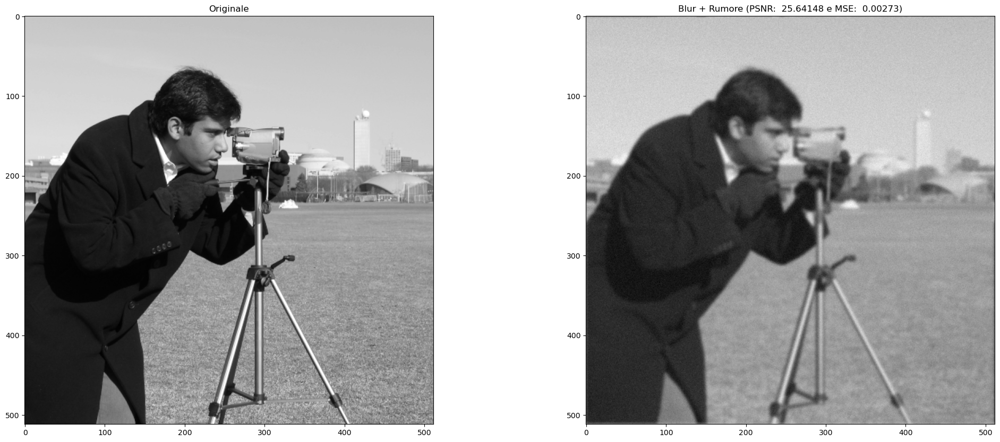

In [6]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, metrics
from scipy import signal
from numpy import fft
from scipy.optimize import minimize

np.random.seed(0)

# Crea un kernel Gaussiano di dimensione kernlen e deviazione standard sigma
def gaussian_kernel(kernlen, sigma):
    x = np.linspace(- (kernlen // 2), kernlen // 2, kernlen)    
    # Kernel gaussiano unidmensionale
    kern1d = np.exp(- 0.5 * (x**2 / sigma))
    # Kernel gaussiano bidimensionale
    kern2d = np.outer(kern1d, kern1d)
    # Normalizzazione
    return kern2d / kern2d.sum()

# Esegui l'fft del kernel K di dimensione d agggiungendo gli zeri necessari 
# ad arrivare a dimensione shape
def psf_fft(K, d, shape):
    # Aggiungi zeri
    K_p = np.zeros(shape)
    K_p[:d, :d] = K

    # Sposta elementi
    p = d // 2
    K_pr = np.roll(np.roll(K_p, -p, 0), -p, 1)

    # Esegui FFT
    K_otf = fft.fft2(K_pr)
    return K_otf

# Moltiplicazione per A
def A(x, K):
  x = fft.fft2(x)
  return np.real(fft.ifft2(K * x))

# Moltiplicazione per A trasposta
def AT(x, K):
  x = fft.fft2(x)
  return np.real(fft.ifft2(np.conj(K) * x))

X = data.camera().astype(np.float64) / 255.0
m, n = X.shape

# Genera il filtro al blur
K = psf_fft(gaussian_kernel(9, 3), 9, X.shape)

# Genera il rumore
sigma = 0.02 # Tra 0.001 e 0.1, più si va verso gli estremi meno/più 
noise = np.random.normal(0, sigma, size = X.shape)

# Aggiungo blur e noise
b = A(X, K) + noise

PSNR = metrics.peak_signal_noise_ratio(X, b)
MSE = metrics.mean_squared_error(X, b)

plt.figure(figsize = (25, 10))

ax1 = plt.subplot(1, 2, 1)
ax1.imshow(X, cmap = 'gray')
plt.title('Originale')

ax2 = plt.subplot(1, 2, 2)
ax2.imshow(b, cmap = 'gray')
plt.title(f'Blur + Rumore (PSNR: {PSNR: .5f} e MSE: {MSE: .5f})')

plt.show()

# B Soluzione naive
Una possibile ricostruzione dell’immagine originale $x$ partendo dall’immagine corrotta $b$ è la soluzione naive data dal minimo del seguente problema di ottimizzazione:

$$x^∗ = arg min_x \frac{1}{2}||Ax - b||^2_2$$

La funzione $f$ da minimizzare è data dalla formula

$$f (x) = \frac{1}{2} ||Ax − b||^2_2$$

il cui gradiente $∇f$ è dato da

$$∇f (x) = A^T Ax − A^T b$$


## Esercizio 2
1. Utilizzando il metodo del gradiente coniugato implementato dalla funzione
`minimize`, calcolare la soluzione naive.
2. Analizza l’andamento del PSNR e dell’MSE al variare del numero di iterazioni.

/tmp/ipykernel_4511/3636828826.py:87: DeprecationWarning: Use of `minimize` with `x0.ndim != 1` is deprecated. Currently, singleton dimensions will be removed from `x0`, but an error will be raised in SciPy 1.11.0.
  res = minimize(f, x0, method = 'CG', jac = df, options = {'maxiter': max_it, 'return_all': True})


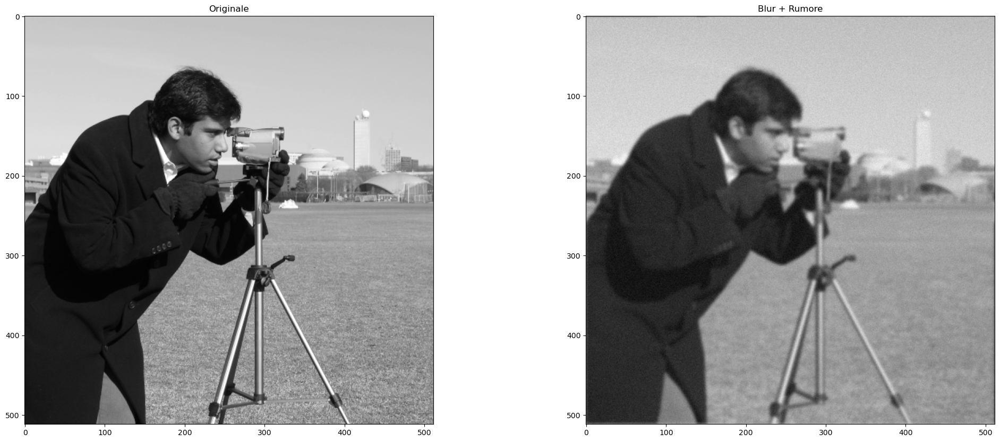

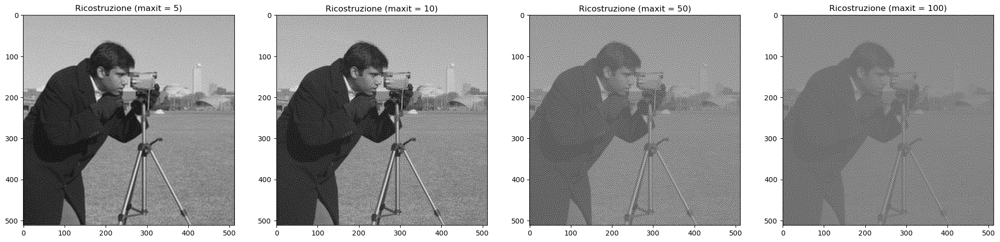

[26.555179492677606, 24.634337832553243, 10.502413953464531, 3.1961134562278977]
[0.00221045689685488, 0.003440061578942624, 0.08907556888110593, 0.47905861478687845]


Text(0.5, 1.0, 'iterazioni vs MSE')

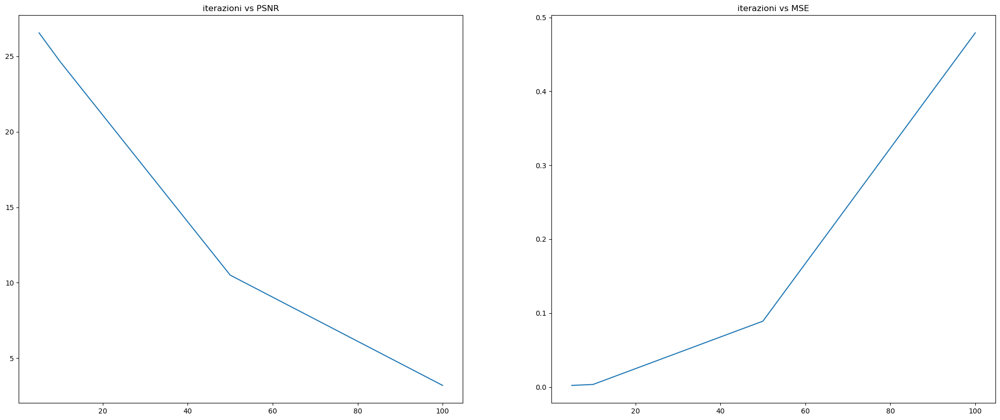

In [26]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, metrics
from scipy import signal
from numpy import fft
from scipy.optimize import minimize

np.random.seed(0)

# Crea un kernel Gaussiano di dimensione kernlen e deviazione standard sigma
def gaussian_kernel(kernlen, sigma):
    x = np.linspace(- (kernlen // 2), kernlen // 2, kernlen)    
    # Kernel gaussiano unidmensionale
    kern1d = np.exp(- 0.5 * (x**2 / sigma))
    # Kernel gaussiano bidimensionale
    kern2d = np.outer(kern1d, kern1d)
    # Normalizzazione
    return kern2d / kern2d.sum()

# Esegui l'fft del kernel K di dimensione d agggiungendo gli zeri necessari 
# ad arrivare a dimensione shape
def psf_fft(K, d, shape):
    # Aggiungi zeri
    K_p = np.zeros(shape)
    K_p[:d, :d] = K

    # Sposta elementi
    p = d // 2
    K_pr = np.roll(np.roll(K_p, -p, 0), -p, 1)

    # Esegui FFT
    K_otf = fft.fft2(K_pr)
    return K_otf

# Moltiplicazione per A
def A(x, K):
  x = fft.fft2(x)
  return np.real(fft.ifft2(K * x))

# Moltiplicazione per A trasposta
def AT(x, K):
  x = fft.fft2(x)
  return np.real(fft.ifft2(np.conj(K) * x))

X = data.camera().astype(np.float64) / 255.0
m, n = X.shape

# Genera il filtro al blur
K = psf_fft(gaussian_kernel(9, 3), 9, X.shape)

# Genera il rumore
sigma = 0.02 # Tra 0.001 e 0.1, più si va verso gli estremi meno/più 
noise = np.random.normal(0, sigma, size = X.shape)

# Aggiungo blur e noise
b = A(X, K) + noise

def f(x):
  x_reshaped = np.reshape(x, (m, n))
  res = 0.5 * np.sum(np.square((A(x_reshaped, K) - b)))
  return res

def df(x):
  x_reshaped = np.reshape(x, (m, n))
  res = AT(A(x_reshaped, K), K) - AT(b, K)
  res = np.reshape(res, m*n)
  return res

x0 = b
max_it_list = [5, 10, 50, 100]
PSNR_list = []
MSE_list = []

plt.figure(figsize = (25, 10))
ax1 = plt.subplot(1, 2, 1)
ax1.imshow(X, cmap = 'gray')
plt.title('Originale')
ax2 = plt.subplot(1, 2, 2)
ax2.imshow(b, cmap = 'gray')
plt.title(f'Blur + Rumore')

fig, axs = plt.subplots(1, len(max_it_list), figsize=(25, 10))
axs = axs.ravel()

for i, max_it in enumerate(max_it_list):
  
  res = minimize(f, x0, method = 'CG', jac = df, options = {'maxiter': max_it, 'return_all': True})

  res_reshaped = np.reshape(res.x, (m, n))
  PSNR_n = metrics.peak_signal_noise_ratio(X, res_reshaped)
  PSNR_list.append(PSNR_n)
  MSE_n = metrics.mean_squared_error(X, res_reshaped)
  MSE_list.append(MSE_n)

  axs[i].imshow(res_reshaped, cmap = 'gray')
  axs[i].set_title(f'Ricostruzione (maxit = {max_it})')
  
plt.show()

print(PSNR_list)
print(MSE_list)

plt.figure(figsize = (25, 10))
plt.subplot(1, 2, 1)
plt.plot(max_it_list, PSNR_list, label='PSNR')
plt.title('iterazioni vs PSNR')

plt.subplot(1, 2, 2)
plt.plot(max_it_list, MSE_list, label='MSE')
plt.title('iterazioni vs MSE')


# C Soluzione regolarizzata
Per ridurre gli effetti del rumore nella ricostruzione è necessario introdurre un termine di regolarizzazione di Tikhonov. Si considera quindi il seguente problema di ottimizzazione.

$$x^∗ = arg min_x \frac{1}{2} ||Ax − b||^2_2 + \frac{λ}{2} ||x||^2_2$$

La funzione $f$ da minimizzare diventa

$$f (x) = \frac{1}{2} ||Ax − b||^2_2 + \frac{λ}{2} ||x||^2_2$$

il cui gradiente $∇f$ è dato da

$$∇f (x) = A^T Ax − A^T b + λx$$

## Esercizio 3
1. Utilizzando il metodo del gradiente coniugato implementato dalla funzione `minimize`, calcolare la soluzione regolarizzata.
2. Analizza l’andamento del PSNR e dell’MSE al variare del numero di iterazioni.
3. Facendo variare $λ$, analizzare come questo influenza le prestazioni del metodo analizzando le immagini.
4. Attraverso test sperimentali individuare il valore di $λ$ che minimizza il
PSNR.

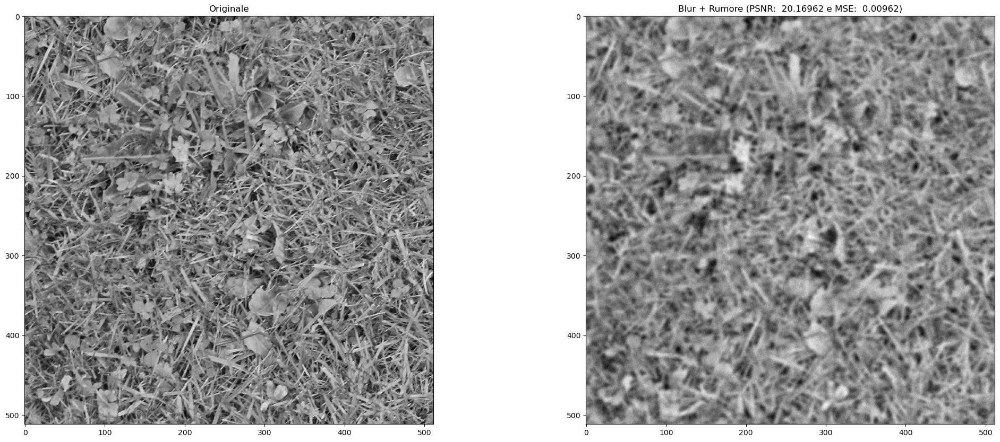

/tmp/ipykernel_4511/2779675276.py:101: DeprecationWarning: Use of `minimize` with `x0.ndim != 1` is deprecated. Currently, singleton dimensions will be removed from `x0`, but an error will be raised in SciPy 1.11.0.
  res = minimize(f, x0, args = (l), method = 'CG', jac = df, options = {'maxiter': massimeIterazioni, 'return_all': True})
/tmp/ipykernel_4511/2779675276.py:101: DeprecationWarning: Use of `minimize` with `x0.ndim != 1` is deprecated. Currently, singleton dimensions will be removed from `x0`, but an error will be raised in SciPy 1.11.0.
  res = minimize(f, x0, args = (l), method = 'CG', jac = df, options = {'maxiter': massimeIterazioni, 'return_all': True})


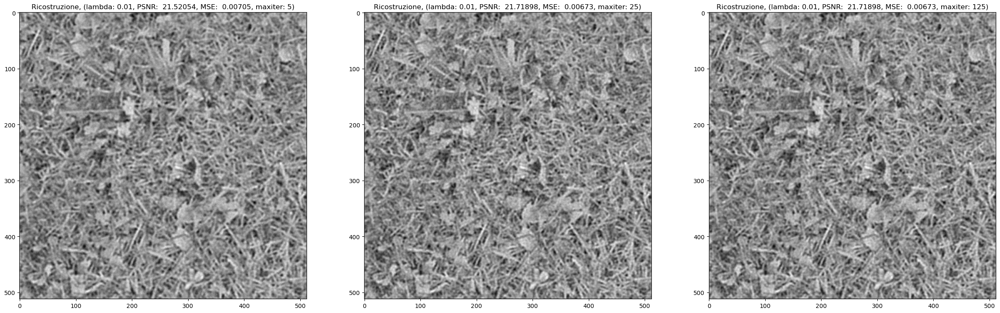

[[21.520542568241442, 21.718982766647752, 21.718982766647752]]
[[0.007046050364885395, 0.006731343038040568, 0.006731343038040568]]


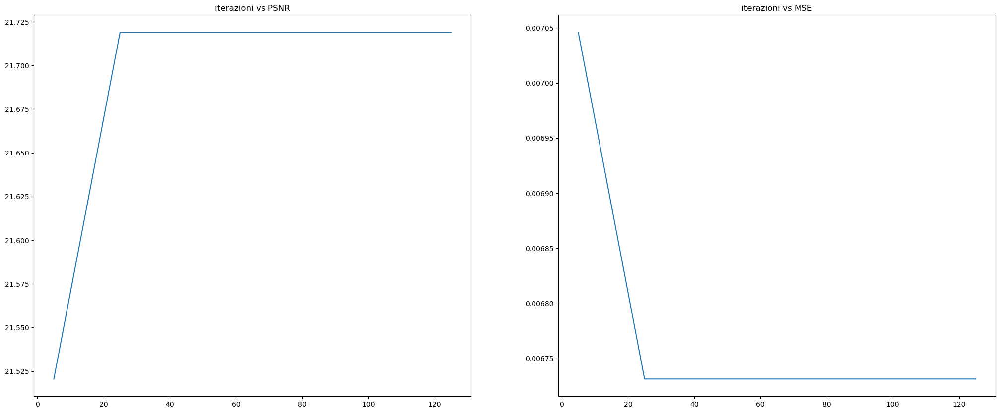

Minimo PSNR = 21.520542568241442
[0 0]
Rispettivamente per lambda = 0.01 e iterazioni = 5


/tmp/ipykernel_4511/2779675276.py:101: DeprecationWarning: Use of `minimize` with `x0.ndim != 1` is deprecated. Currently, singleton dimensions will be removed from `x0`, but an error will be raised in SciPy 1.11.0.
  res = minimize(f, x0, args = (l), method = 'CG', jac = df, options = {'maxiter': massimeIterazioni, 'return_all': True})
/tmp/ipykernel_4511/2779675276.py:101: DeprecationWarning: Use of `minimize` with `x0.ndim != 1` is deprecated. Currently, singleton dimensions will be removed from `x0`, but an error will be raised in SciPy 1.11.0.
  res = minimize(f, x0, args = (l), method = 'CG', jac = df, options = {'maxiter': massimeIterazioni, 'return_all': True})
/tmp/ipykernel_4511/2779675276.py:101: DeprecationWarning: Use of `minimize` with `x0.ndim != 1` is deprecated. Currently, singleton dimensions will be removed from `x0`, but an error will be raised in SciPy 1.11.0.
  res = minimize(f, x0, args = (l), method = 'CG', jac = df, options = {'maxiter': massimeIterazioni, 'ret

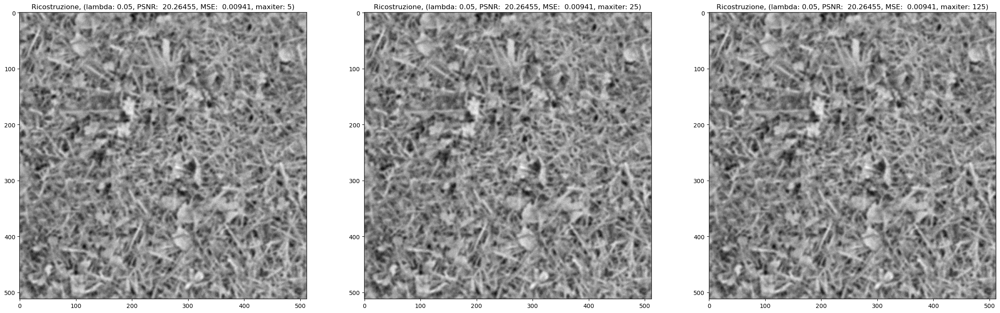

[[21.520542568241442, 21.718982766647752, 21.718982766647752], [20.26454589630021, 20.26454589630021, 20.26454589630021]]
[[0.007046050364885395, 0.006731343038040568, 0.006731343038040568], [0.009409042070048192, 0.009409042070048192, 0.009409042070048192]]


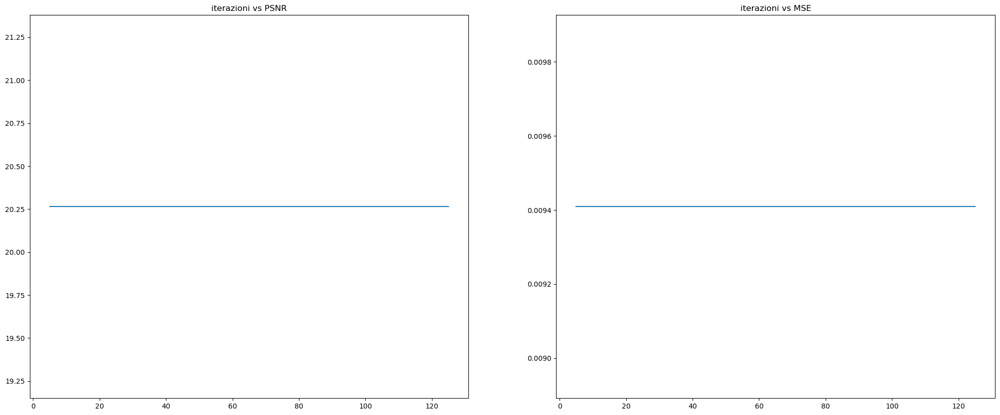

Minimo PSNR = 20.26454589630021
[1 0]
Rispettivamente per lambda = 0.05 e iterazioni = 5


/tmp/ipykernel_4511/2779675276.py:101: DeprecationWarning: Use of `minimize` with `x0.ndim != 1` is deprecated. Currently, singleton dimensions will be removed from `x0`, but an error will be raised in SciPy 1.11.0.
  res = minimize(f, x0, args = (l), method = 'CG', jac = df, options = {'maxiter': massimeIterazioni, 'return_all': True})
/tmp/ipykernel_4511/2779675276.py:101: DeprecationWarning: Use of `minimize` with `x0.ndim != 1` is deprecated. Currently, singleton dimensions will be removed from `x0`, but an error will be raised in SciPy 1.11.0.
  res = minimize(f, x0, args = (l), method = 'CG', jac = df, options = {'maxiter': massimeIterazioni, 'return_all': True})
/tmp/ipykernel_4511/2779675276.py:101: DeprecationWarning: Use of `minimize` with `x0.ndim != 1` is deprecated. Currently, singleton dimensions will be removed from `x0`, but an error will be raised in SciPy 1.11.0.
  res = minimize(f, x0, args = (l), method = 'CG', jac = df, options = {'maxiter': massimeIterazioni, 'ret

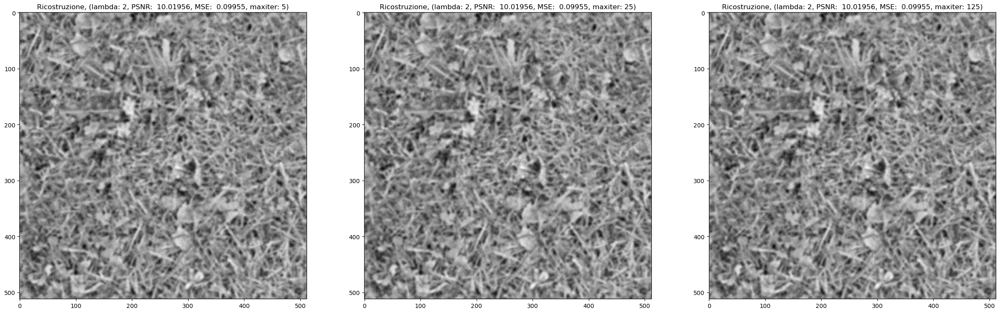

[[21.520542568241442, 21.718982766647752, 21.718982766647752], [20.26454589630021, 20.26454589630021, 20.26454589630021], [10.019563770023305, 10.019563770023305, 10.019563770023305]]
[[0.007046050364885395, 0.006731343038040568, 0.006731343038040568], [0.009409042070048192, 0.009409042070048192, 0.009409042070048192], [0.09955054065314226, 0.09955054065314226, 0.09955054065314226]]


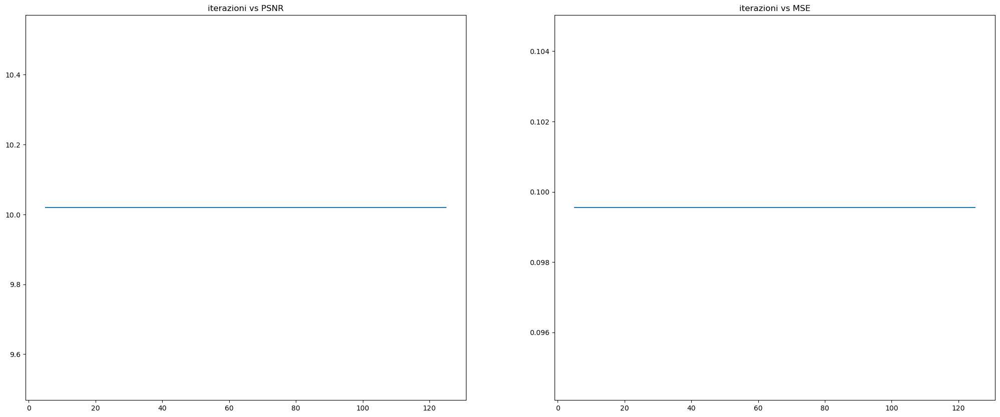

Minimo PSNR = 10.019563770023305
[2 0]
Rispettivamente per lambda = 2 e iterazioni = 5


In [35]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, metrics
from scipy import signal
from numpy import fft
from scipy.optimize import minimize

np.random.seed(0)

# Crea un kernel Gaussiano di dimensione kernlen e deviazione standard sigma
def gaussian_kernel(kernlen, sigma):
    x = np.linspace(- (kernlen // 2), kernlen // 2, kernlen)    
    # Kernel gaussiano unidmensionale
    kern1d = np.exp(- 0.5 * (x**2 / sigma))
    # Kernel gaussiano bidimensionale
    kern2d = np.outer(kern1d, kern1d)
    # Normalizzazione
    return kern2d / kern2d.sum()

# Esegui l'fft del kernel K di dimensione d agggiungendo gli zeri necessari 
# ad arrivare a dimensione shape
def psf_fft(K, d, shape):
    # Aggiungi zeri
    K_p = np.zeros(shape)
    K_p[:d, :d] = K

    # Sposta elementi
    p = d // 2
    K_pr = np.roll(np.roll(K_p, -p, 0), -p, 1)

    # Esegui FFT
    K_otf = fft.fft2(K_pr)
    return K_otf

# Moltiplicazione per A
def A(x, K):
  x = fft.fft2(x)
  return np.real(fft.ifft2(K * x))

# Moltiplicazione per A trasposta
def AT(x, K):
  x = fft.fft2(x)
  return np.real(fft.ifft2(np.conj(K) * x))

X = data.grass().astype(np.float64) / 255.0
m, n = X.shape

# Genera il filtro al blur
K = psf_fft(gaussian_kernel(9, 3), 9, X.shape)

# Genera il rumore
sigma = 0.02 # Tra 0.001 e 0.1, più si va verso gli estremi meno/più 
noise = np.random.normal(0, sigma, size = X.shape)

# Aggiungo blur e noise
b = A(X, K) + noise

def f(x, lamd):
  x_reshaped = np.reshape(x, (m, n))
  res = 0.5 * np.sum((A(x_reshaped, K) - b) ** 2 + 0.5 * lamd * x_reshaped ** 2)
  return res

def df(x, lamd):
  x_reshaped = np.reshape(x, (m, n))
  res = AT(A(x_reshaped, K), K) - AT(b, K) + lamd * x_reshaped
  res = np.reshape(res, m*n)
  return res

x0 = b
#max_it = [5, 25, 125, 625]
max_it = [5, 25, 125]
#lamd = [0.01, 0.02, 0.05, 0.1, 0.5, 2, 5]
lamd = [0.01, 0.05, 2]
PSNR_list = []
MSE_list = []

plt.figure(figsize = (25, 10))
  
plt.subplot(1, 2, 1)
plt.imshow(X, cmap = 'gray')
plt.title('Originale')

PSNR = metrics.peak_signal_noise_ratio(X, b)
MSE = metrics.mean_squared_error(X, b)
  
plt.subplot(1, 2, 2)
plt.imshow(b, cmap = 'gray')
plt.title(f'Blur + Rumore (PSNR: {PSNR: .5f} e MSE: {MSE: .5f})')

plt.show()

for i, l in enumerate(lamd):
  
  fig, axs = plt.subplots(1, len(max_it), figsize=(10 * len(max_it), 10))
  axs = axs.ravel()

  PSNR_list.append([])
  MSE_list.append([])

  for j, massimeIterazioni in enumerate(max_it):
    res = minimize(f, x0, args = (l), method = 'CG', jac = df, options = {'maxiter': massimeIterazioni, 'return_all': True})

    res_reshaped = np.reshape(res.x, (m, n))
    PSNR = metrics.peak_signal_noise_ratio(X, res_reshaped)
    MSE = metrics.mean_squared_error(X, res_reshaped)
    PSNR_list[i].append(PSNR)
    MSE_list[i].append(MSE)

    axs[j].imshow(res_reshaped, cmap = 'gray')
    axs[j].set_title(f'Ricostruzione, (lambda: {l}, PSNR: {PSNR: .5f}, MSE: {MSE: .5f}, maxiter: {massimeIterazioni})')

  plt.show()

  print(PSNR_list)
  print(MSE_list)
  
  plt.figure(figsize = (25, 10))
  
  plt.subplot(1, 2, 1)
  plt.plot(max_it, PSNR_list[i], label='PSNR')
  plt.title('iterazioni vs PSNR')
  
  plt.subplot(1, 2, 2)
  plt.plot(max_it, MSE_list[i], label='MSE')
  plt.title('iterazioni vs MSE')

  plt.show()

  print("Minimo PSNR =", np.min(np.array(PSNR_list)))
  indexes = np.array(np.where(PSNR_list == np.min(np.array(PSNR_list))))[:,0]
  print(indexes)
  print("Rispettivamente per lambda =", lamd[indexes[0]], "e iterazioni =", max_it[indexes[1]])


## Esercizio 4
Degradare due nuove immagini applicando, mediante le funzioni `gaussian_kernel()` `psf_fft()`, l’operatore di blur con parametri:
- $σ = 0.5$ dimensione $5 × 5$
- $σ = 1$ dimensione $7 × 7$
- $σ = 1.3$ dimensione $9 × 9$

ed aggiungendo rumore gaussiano con deviazione standard $(0, 0.05]$.

1. Ripetere gli esercizi 2 e 3 con le nuove immagini.
2. Ripetere gli esercizi 2 e 3 sostituendo il metodo del gradiente coniugato con il metodo del gradiente da voi implementato nello scorso laboratorio.

####################################################
Esercizio 3, sigma = 0.5, dim = 5, devNoise = 0.02, type = custom
####################################################
5
10
50
100


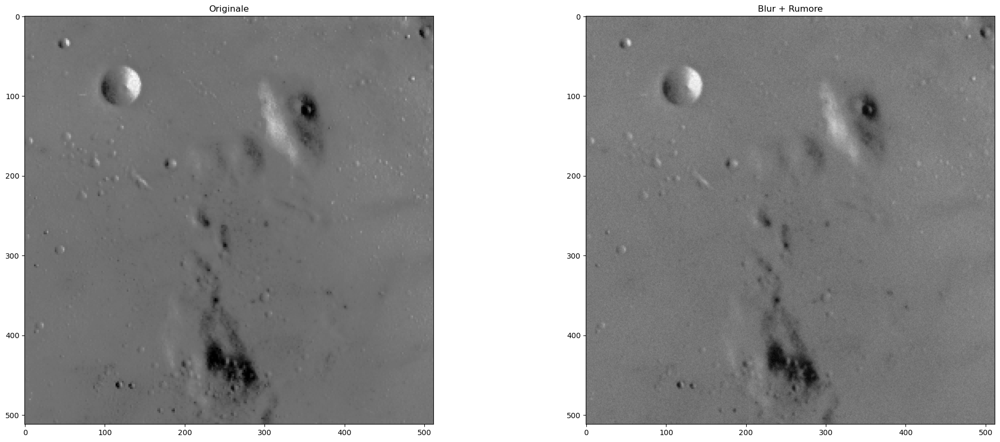

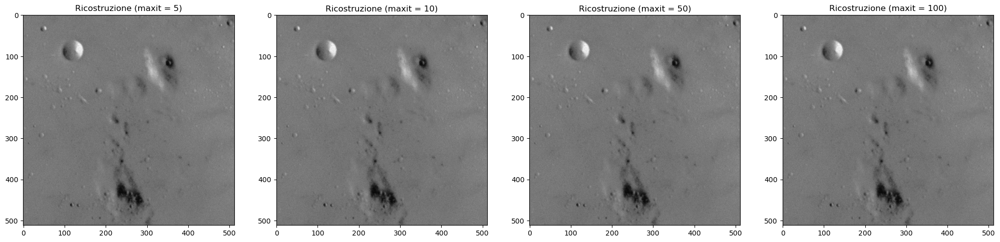

[33.56097432674798, 33.56097432674798, 33.56097432674798, 33.56097432674798]
[0.0004404560374198539, 0.0004404560374198539, 0.0004404560374198539, 0.0004404560374198539]
####################################################
Esercizio 4, sigma = 0.5, dim = 5, devNoise = 0.02, type = custom
####################################################


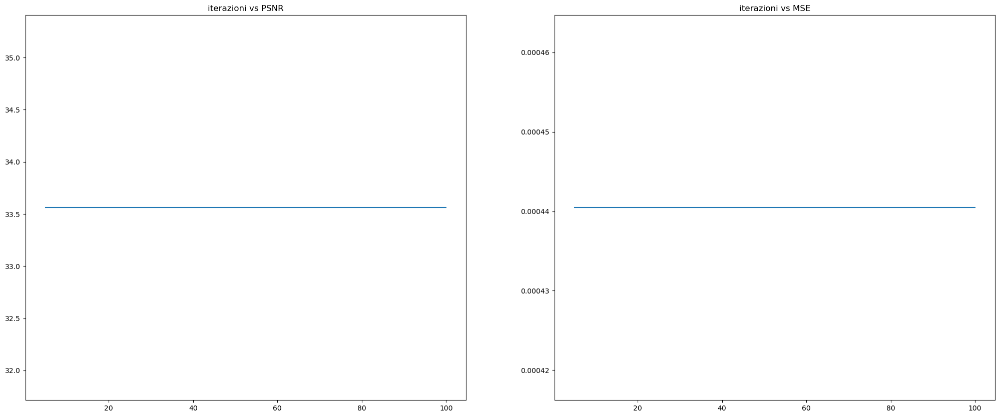

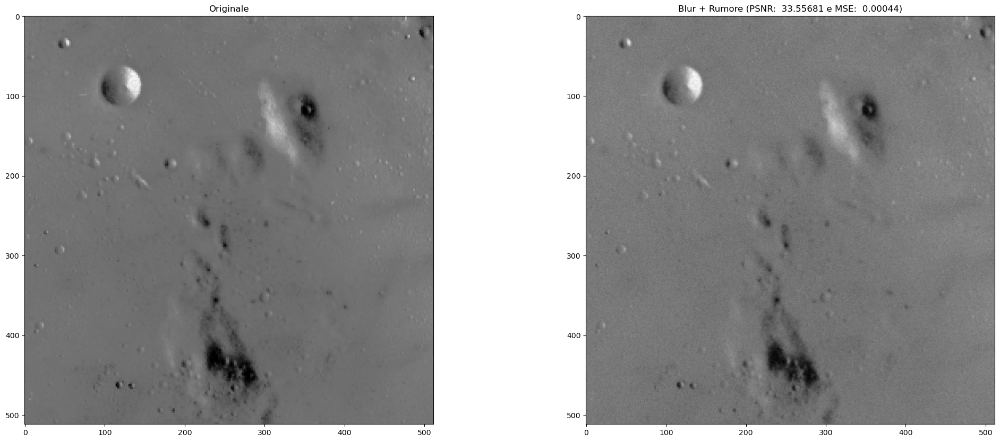

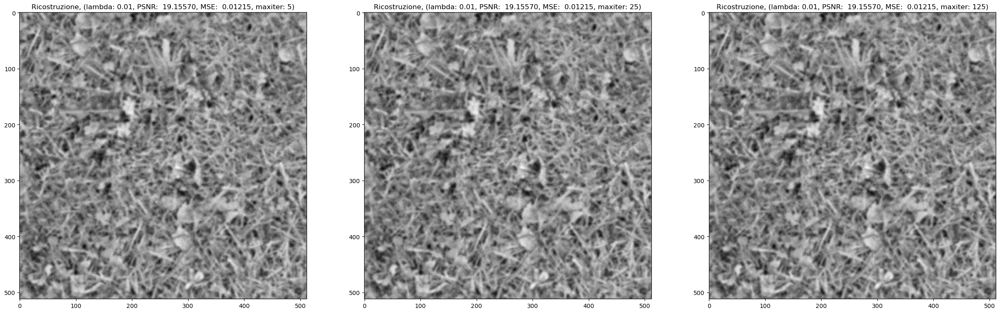

[[19.155695133164137, 19.155695133164137, 19.155695133164137]]
[[0.012145921968887275, 0.012145921968887275, 0.012145921968887275]]


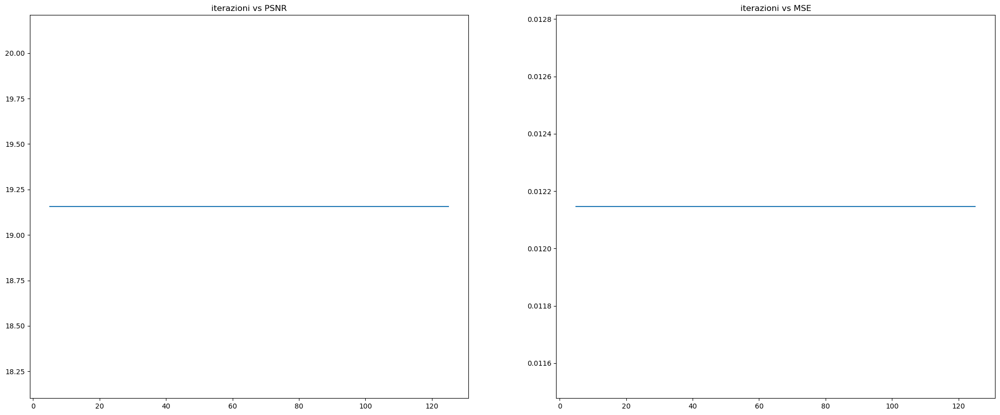

Minimo PSNR = 19.155695133164137
[0 0]
Rispettivamente per lambda = 0.01 e iterazioni = 5


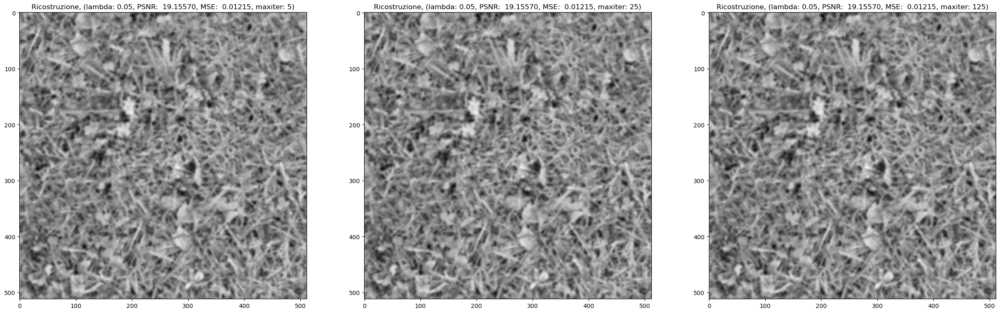

[[19.155695133164137, 19.155695133164137, 19.155695133164137], [19.155695133164137, 19.155695133164137, 19.155695133164137]]
[[0.012145921968887275, 0.012145921968887275, 0.012145921968887275], [0.012145921968887275, 0.012145921968887275, 0.012145921968887275]]


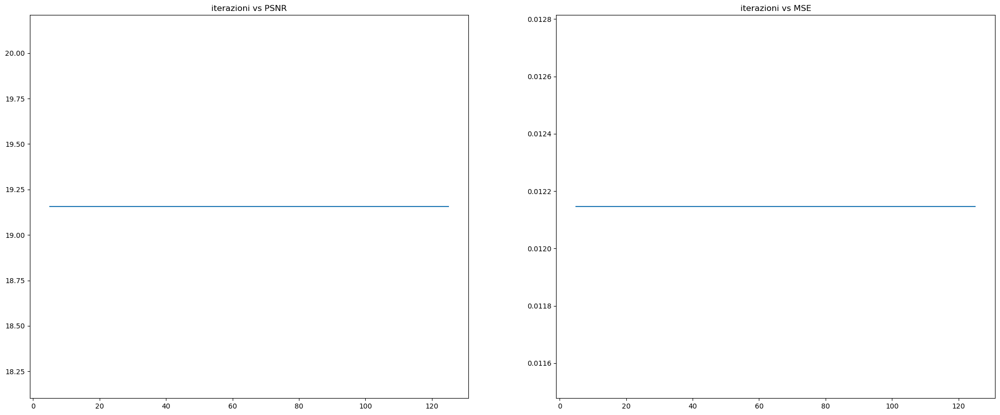

Minimo PSNR = 19.155695133164137
[0 0]
Rispettivamente per lambda = 0.01 e iterazioni = 5


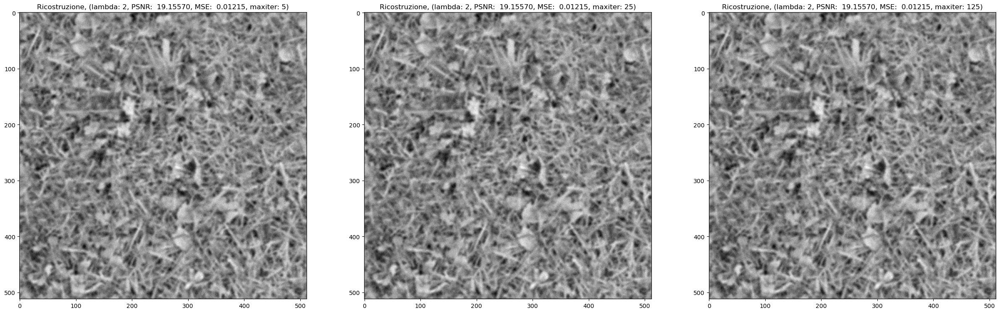

[[19.155695133164137, 19.155695133164137, 19.155695133164137], [19.155695133164137, 19.155695133164137, 19.155695133164137], [19.155695133164137, 19.155695133164137, 19.155695133164137]]
[[0.012145921968887275, 0.012145921968887275, 0.012145921968887275], [0.012145921968887275, 0.012145921968887275, 0.012145921968887275], [0.012145921968887275, 0.012145921968887275, 0.012145921968887275]]


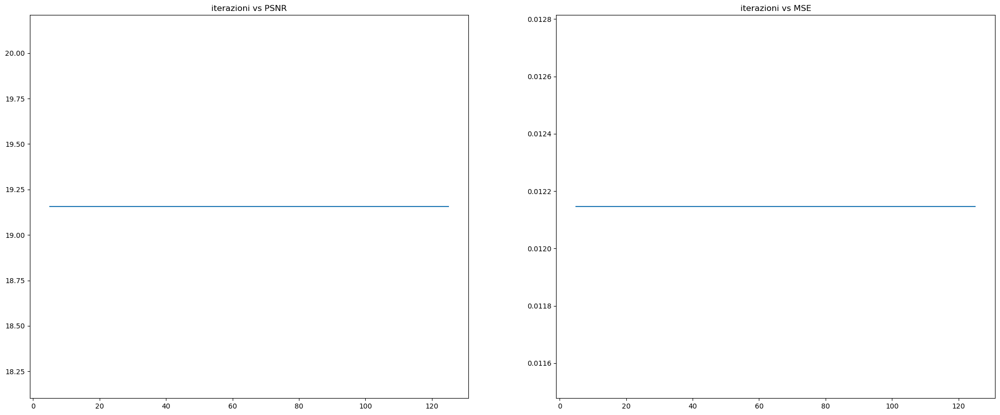

Minimo PSNR = 19.155695133164137
[0 0]
Rispettivamente per lambda = 0.01 e iterazioni = 5
####################################################
Esercizio 3, sigma = 0.5, dim = 5, devNoise = 0.02, type = gradient_lib
####################################################
5
f <function f at 0x7f0663b2ed40>
x0 [[0.45819672 0.42840163 0.45981023 ... 0.41362495 0.39515998 0.42048096]
 [0.44928118 0.43616079 0.47136185 ... 0.35845717 0.35895133 0.39066289]
 [0.45109015 0.47672462 0.48951644 ... 0.34176389 0.36001506 0.38477725]
 ...
 [0.42290532 0.46395358 0.43205579 ... 0.44187931 0.4686842  0.44108252]
 [0.44977926 0.44789176 0.41239326 ... 0.49038178 0.471562   0.46880323]
 [0.47087717 0.45412259 0.47340121 ... 0.41554617 0.45163916 0.44340942]]
df <function df at 0x7f065ffb5510>


/tmp/ipykernel_4511/2380142568.py:136: DeprecationWarning: Use of `minimize` with `x0.ndim != 1` is deprecated. Currently, singleton dimensions will be removed from `x0`, but an error will be raised in SciPy 1.11.0.
  res = opt.minimize(f, x0, method = 'CG', jac = df, options = {'maxiter': max_it, 'return_all': True}, args = 0)


ValueError: The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()

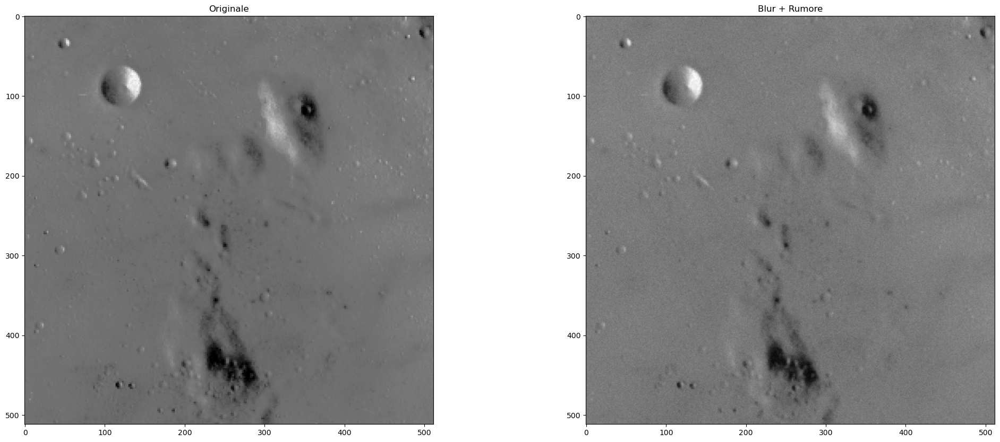

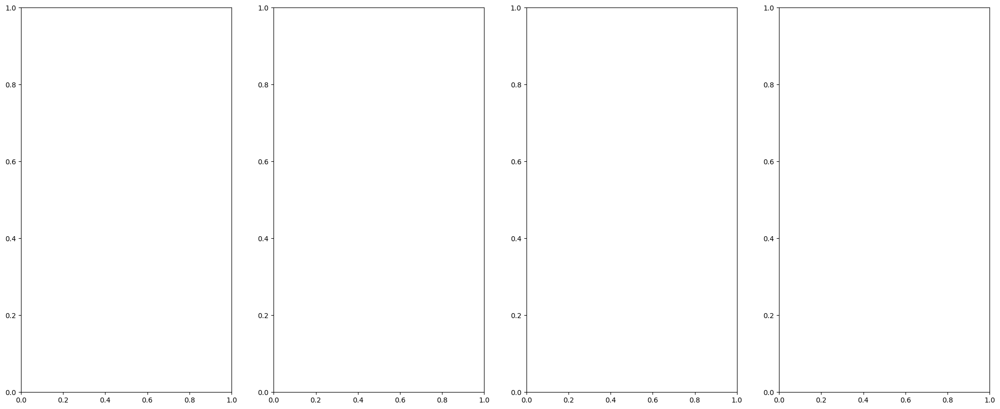

In [81]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, metrics
from scipy import signal
from numpy import fft
import scipy.optimize as opt

np.random.seed(0)

# Crea un kernel Gaussiano di dimensione kernlen e deviazione standard sigma
def gaussian_kernel(kernlen, sigma):
    x = np.linspace(- (kernlen // 2), kernlen // 2, kernlen)    
    # Kernel gaussiano unidmensionale
    kern1d = np.exp(- 0.5 * (x**2 / sigma))
    # Kernel gaussiano bidimensionale
    kern2d = np.outer(kern1d, kern1d)
    # Normalizzazione
    return kern2d / kern2d.sum()

# Esegui l'fft del kernel K di dimensione d agggiungendo gli zeri necessari 
# ad arrivare a dimensione shape
def psf_fft(K, d, shape):
    # Aggiungi zeri
    K_p = np.zeros(shape)
    K_p[:d, :d] = K

    # Sposta elementi
    p = d // 2
    K_pr = np.roll(np.roll(K_p, -p, 0), -p, 1)

    # Esegui FFT
    K_otf = fft.fft2(K_pr)
    return K_otf

# Moltiplicazione per A
def A(x, K):
  x = fft.fft2(x)
  return np.real(fft.ifft2(K * x))

# Moltiplicazione per A trasposta
def AT(x, K):
  x = fft.fft2(x)
  return np.real(fft.ifft2(np.conj(K) * x))

def next_step(x, grad, lamd): # backtracking procedure for the choice of the steplength
  alpha = 1
  rho = 0.5
  c1 = 0.25
  p = -grad
  j = 0
  jmax = 100
  #print(grad)
  #print(p)
  while (f(x + alpha * p, lamd) > f(x, lamd) + c1 * alpha * grad.T @ p and j < jmax and alpha > 1e-16):
    alpha = rho * alpha
    j = j + 1
  if (j >= jmax or alpha <= 1e-5): # se termino il while, perchè? alpha va bene vs cicli max raggiunti
    return -1
  
  return alpha

def minimize(x0, step, MAXITERATION, ABSOLUTE_STOP, lamd, f, grad_f):
  k = 0
  x_last = np.array(x0)
  x_lastlast = x_last

  while (np.linalg.norm(grad_f(x_last, lamd)) > ABSOLUTE_STOP and np.linalg.norm(x_last - x_lastlast) > 1e-10 and k < MAXITERATION):
    k = k + 1
      
    grad = grad_f(x_last, lamd)
      
    # backtracking step
    step = next_step(x_last, grad, lamd)
    
    if (step == -1): # alpha troppo piccolo o jmax superato
      print('alpha troppo piccolo, non converge')

    x_lastlast = x_last
      
    x_last = x_last - step * grad
 
  return x_last

def f(x, lamd):
  x_reshaped = np.reshape(x, (m, n))
  res = 0.5 * np.sum((A(x_reshaped, K) - b) ** 2 + 0.5 * lamd * x_reshaped ** 2)
  return res

def df(x, lamd):
  x_reshaped = np.reshape(x, (m, n))
  res = AT(A(x_reshaped, K), K) - AT(b, K)
  return res

def esercizio_3(X, sigma, dim, devNoise, type):
  print('####################################################')
  print(f'Esercizio 3, sigma = {sigma}, dim = {dim}, devNoise = {devNoise}, type = {type}')
  print('####################################################')
  m, n = X.shape

  # Genera il filtro al blur
  K = psf_fft(gaussian_kernel(dim, sigma), dim, X.shape)

  # Genera il rumore
  devNoise = 0.02 # Tra 0.001 e 0.1, più si va verso gli estremi meno/più 
  noise = np.random.normal(0, devNoise, size = X.shape)

  # Aggiungo blur e noise
  b = A(X, K) + noise

  x0 = b
  max_it_list = [5, 10, 50, 100]
  PSNR_list = []
  MSE_list = []

  plt.figure(figsize = (25, 10))
  ax1 = plt.subplot(1, 2, 1)
  ax1.imshow(X, cmap = 'gray')
  plt.title('Originale')
  ax2 = plt.subplot(1, 2, 2)
  ax2.imshow(b, cmap = 'gray')
  plt.title(f'Blur + Rumore')

  fig, axs = plt.subplots(1, len(max_it_list), figsize=(25, 10))
  axs = axs.ravel()

  for i, max_it in enumerate(max_it_list):
    print(max_it)
    res_reshaped = []
    if (type == 'custom'):
      res = minimize(x0, step=0.1, MAXITERATION=max_it, ABSOLUTE_STOP=1e-5, lamd = 0, f = f, grad_f = df)
      res_reshaped = np.reshape(res, (m, n))
    else:
      print('f', f)
      print('x0', x0)
      print('df', df)
      res = opt.minimize(f, x0, method = 'CG', jac = df, options = {'maxiter': max_it, 'return_all': True}, args = 0)
      res_reshaped = np.reshape(res.x, (m, n))

    PSNR_n = metrics.peak_signal_noise_ratio(X, res_reshaped)
    PSNR_list.append(PSNR_n)
    MSE_n = metrics.mean_squared_error(X, res_reshaped)
    MSE_list.append(MSE_n)

    axs[i].imshow(res_reshaped, cmap = 'gray')
    axs[i].set_title(f'Ricostruzione (maxit = {max_it})')

  plt.show()

  print(PSNR_list)
  print(MSE_list)

  plt.figure(figsize = (25, 10))
  plt.subplot(1, 2, 1)
  plt.plot(max_it_list, PSNR_list, label='PSNR')
  plt.title('iterazioni vs PSNR')

  plt.subplot(1, 2, 2)
  plt.plot(max_it_list, MSE_list, label='MSE')
  plt.title('iterazioni vs MSE')

def esercizio_4(X, sigma, dim, devNoise, type):
  print('####################################################')
  print(f'Esercizio 4, sigma = {sigma}, dim = {dim}, devNoise = {devNoise}, type = {type}')
  print('####################################################')
  m, n = X.shape

  # Genera il filtro al blur
  K = psf_fft(gaussian_kernel(dim, sigma), dim, X.shape)

  # Genera il rumore
  devNoise = 0.02 # Tra 0.001 e 0.1, più si va verso gli estremi meno/più 
  noise = np.random.normal(0, devNoise, size = X.shape)

  # Aggiungo blur e noise
  b = A(X, K) + noise
    
  #print('iterations =', k)
  #print('last guess: x = (%f, %f)' %(x[0,k], x[1,k]))
  #print('x_true =', x_true)
  max_it = [5, 25, 125]
  lamd = [0.01, 0.05, 2]
  PSNR_list = []
  MSE_list = []

  plt.figure(figsize = (25, 10))

  plt.subplot(1, 2, 1)
  plt.imshow(X, cmap = 'gray')
  plt.title('Originale')

  PSNR = metrics.peak_signal_noise_ratio(X, b)
  MSE = metrics.mean_squared_error(X, b)

  plt.subplot(1, 2, 2)
  plt.imshow(b, cmap = 'gray')
  plt.title(f'Blur + Rumore (PSNR: {PSNR: .5f} e MSE: {MSE: .5f})')

  plt.show()

  for i, l in enumerate(lamd):

    fig, axs = plt.subplots(1, len(max_it), figsize=(10 * len(max_it), 10))
    axs = axs.ravel()

    PSNR_list.append([])
    MSE_list.append([])

    for j, massimeIterazioni in enumerate(max_it):
      res_reshaped = []
      if (type == 'custom'):
        res = minimize(x0, step=0.1, MAXITERATION=massimeIterazioni, ABSOLUTE_STOP=1e-5, lamd = l, f = f, grad_f = df)
        res_reshaped = np.reshape(res, (m, n))
      else:
        res = opt.minimize(f, x0, method = 'CG', jac = df, options = {'maxiter': massimeIterazioni, 'return_all': True}, args = (0))
        res_reshaped = np.reshape(res.x, (m, n))

      PSNR = metrics.peak_signal_noise_ratio(X, res_reshaped)
      MSE = metrics.mean_squared_error(X, res_reshaped)
      PSNR_list[i].append(PSNR)
      MSE_list[i].append(MSE)

      axs[j].imshow(res_reshaped, cmap = 'gray')
      axs[j].set_title(f'Ricostruzione, (lambda: {l}, PSNR: {PSNR: .5f}, MSE: {MSE: .5f}, maxiter: {massimeIterazioni})')

    plt.show()

    print(PSNR_list)
    print(MSE_list)

    plt.figure(figsize = (25, 10))

    plt.subplot(1, 2, 1)
    plt.plot(max_it, PSNR_list[i], label='PSNR')
    plt.title('iterazioni vs PSNR')

    plt.subplot(1, 2, 2)
    plt.plot(max_it, MSE_list[i], label='MSE')
    plt.title('iterazioni vs MSE')

    plt.show()

    print("Minimo PSNR =", np.min(np.array(PSNR_list)))
    indexes = np.array(np.where(PSNR_list == np.min(np.array(PSNR_list))))[:,0]
    print(indexes)
    print("Rispettivamente per lambda =", lamd[indexes[0]], "e iterazioni =", max_it[indexes[1]])




X = data.moon().astype(np.float64) / 255.0
s = [0.5, 1, 1.3]
dim = [5, 7, 9]
devNoise = 0.02

for i in range(0, 3):
  esercizio_3(X, s[i], dim[i], devNoise, type='custom')
  esercizio_4(X, s[i], dim[i], devNoise, type='custom')
  esercizio_3(X, s[i], dim[i], devNoise, type='gradient_lib')
  esercizio_4(X, s[i], dim[i], devNoise, type='gradient_lib')

# X = data.cell().astype(np.float64) / 255.0

# for i in range(0, 3):
  # esercizio_3(X, s[i], dim[i], devNoise, type='custom')
  # esercizio_4(X, s[i], dim[i], devNoise, type='custom')
  # esercizio_3(X, s[i], dim[i], devNoise, type='gradient_lib')
  # esercizio_4(X, s[i], dim[i], devNoise, type='gradient_lib')